# Funnel Models

In [1]:
using Distributions
using DataFrames
using ForwardDiff
using MCMCChains
using LinearAlgebra


include("lahmc.jl")
include("run_lahmc.jl")

sample_loop (generic function with 1 method)

# The Devil's Funnel

In [2]:
n_samples = 5000
n_chains = 100
epsilon = 0.01
K = 4
L = 10
beta = 0.1
n_param = 2

2

In [3]:

function U(X)
    v = X[1]
    x = X[2]
    return -(logpdf(Normal(0, 3), v) + logpdf(Normal(0,exp(v)), x))  
end

function dU(X)
    return ForwardDiff.gradient(U, [X[1], X[2]])
end

function init_q()
    init_sample = [randn(), 1]
    return init_sample
end

init_q (generic function with 1 method)

In [4]:
lahmc_samples = sample_loop(n_chains, U, dU, init_q, epsilon, L, K, beta, n_param, n_samples)

Dict{Any, Any} with 3 entries:
  :samples    => [-0.200039 0.274023 … -1.65327 0.772809; 1.0 1.0 … 1.0 1.0;;; …
  :trans      => Dict("L1"=>0.988468, "L2"=>0.00203841, "L3"=>0.000858172, "L4"…
  :grad_evals => 5147280

In [5]:
hmc_samples = sample_loop(n_chains, U, dU, init_q, epsilon, L, 1, beta, n_param, n_samples)

Dict{Any, Any} with 3 entries:
  :samples    => [0.978447 0.338089 … 0.0557919 -0.279217; 1.0 1.0 … 1.0 1.0;;;…
  :trans      => Dict("L1"=>0.989002, "avg_accept"=>0.989002, "F"=>0.0109982)
  :grad_evals => 4999000

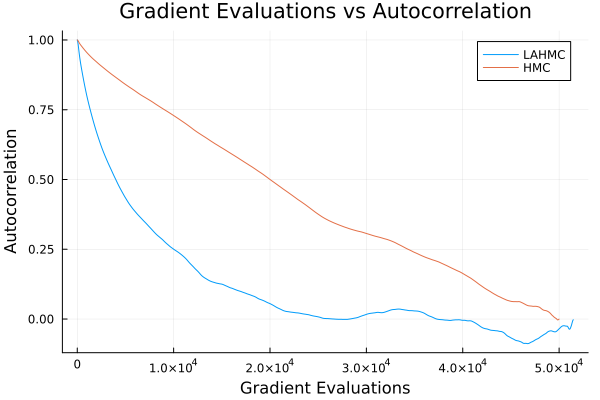

In [6]:
autocorrelation_lahmc = autocorrelation(lahmc_samples[:samples])
autocorrelation_hmc = autocorrelation(hmc_samples[:samples])

gradient_evaluations_lahmc = LinRange(0, lahmc_samples[:grad_evals]/n_chains, length(autocorrelation_lahmc))
gradient_evaluations_hmc = LinRange(0, hmc_samples[:grad_evals]/n_chains, length(autocorrelation_hmc))

plt_lahmc_ac = plot(gradient_evaluations_lahmc, autocorrelation_lahmc, title="Gradient Evaluations vs Autocorrelation", xlabel="Gradient Evaluations", ylabel="Autocorrelation", label="LAHMC")
plt_hmc_ac = plot!(gradient_evaluations_hmc, autocorrelation_hmc, label="HMC")

display(plt_lahmc_ac)

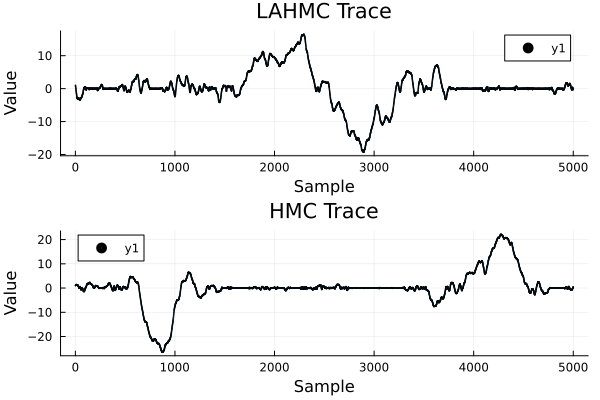

In [7]:
plot(
    scatter(lahmc_samples[:samples][2, 1, :], ms=0.5, title="LAHMC Trace", xlabel="Sample", ylabel="Value"),
    scatter(hmc_samples[:samples][2, 1, :], ms=0.5, title="HMC Trace", xlabel="Sample", ylabel="Value"),
    layout=(2,1)
)

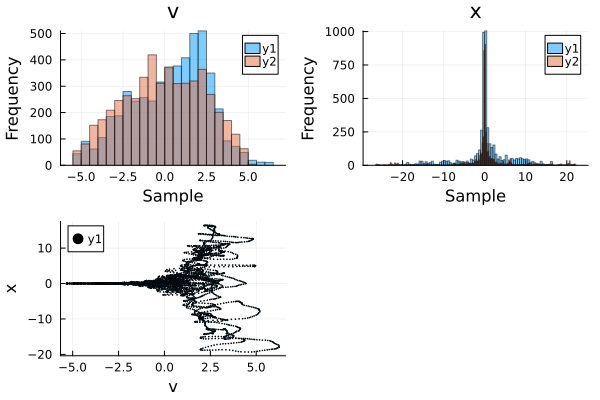

In [8]:
plot(
    histogram([lahmc_samples[:samples][1, 1, :], hmc_samples[:samples][1, 1, :]], bin_width=0.01, alpha=0.5, title="v", xlabel="Sample", ylabel="Frequency"),
    histogram([lahmc_samples[:samples][2, 1, :], hmc_samples[:samples][2, 1, :]], bin_width=1, alpha=0.5, title="x", xlabel="Sample", ylabel="Frequency"),
    scatter(lahmc_samples[:samples][1,1,:], lahmc_samples[:samples][2,1,:], xlabel="v", ylabel="x", ms=0.5)
)

In [9]:
round.(cov(lahmc_samples[:samples][:, 1, :]'), digits=3)

2×2 Matrix{Float64}:
  5.265  -0.443
 -0.443  32.171

In [10]:
lahmc_trans_df = DataFrame(lahmc_samples[:trans])

Row,F,L1,L2,L3,L4,avg_accept
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.00834767,0.988468,0.00203841,0.000858172,0.000288058,0.991652


In [11]:
hmc_trans_df = DataFrame(hmc_samples[:trans])

Row,F,L1,avg_accept
,Float64,Float64,Float64
1,0.0109982,0.989002,0.989002


In [12]:
lahmc_chain = Chains(permutedims(lahmc_samples[:samples], (3,1,2)), [:v, :x])
df_lahmc_summary = DataFrame(MCMCChains.summarize(lahmc_chain))
df_lahmc_summary

Row,parameters,mean,std,mcse,ess_bulk,ess_tail,rhat,ess_per_sec
,Symbol,Float64,Float64,Float64,Float64,Float64,Float64,Missing
1,v,-0.377503,2.28345,0.0493165,2119.02,4351.77,1.08454,missing
2,x,-0.0809294,5.52391,0.155236,2041.06,1485.93,1.12168,missing


In [13]:
hmc_chain = Chains(permutedims(hmc_samples[:samples], (3,1,2)), [:v, :x])
df_hmc_summary = DataFrame(MCMCChains.summarize(hmc_chain))
df_hmc_summary

Row,parameters,mean,std,mcse,ess_bulk,ess_tail,rhat,ess_per_sec
,Symbol,Float64,Float64,Float64,Float64,Float64,Float64,Missing
1,v,-0.223597,2.41341,0.0565645,1812.51,2616.1,1.19376,missing
2,x,-1.25444,11.9905,0.366953,1713.01,1164.88,1.26762,missing


#### Non-centered Parameterised Devils Funnel

In [14]:
# n_samples = 10000
# n_chains = 50
# epsilon = 0.01
# L = 10
# beta = 1
# n_param = 3

In [15]:
# function U(X)
#     v = X[1]
#     z = X[2]
#     x = z*exp(v)
    
#     return -(logpdf(Normal(0, 3), v) + logpdf(Normal(0,1), z) + log(x))  
# end

# function dU(X)
#     return ForwardDiff.gradient(U, [X[1], X[2], X[3]])
# end

# function init_q()
#     init_sample = [randn(), 0, 1]
#     # accepted_sample = burn_in!(LAHMC(U, dU, init_sample, epsilon, L, 1, beta, n_samples))
#     return init_sample
# end

# Beta

In [16]:
# n_samples = 1000
# n_chains = 100
# epsilon = 0.01
L = 10
K = 4
beta = 0.1
n_param = 3

3

In [17]:
function U(X)
    a = X[1]
    b1 = X[2]
    b2 = X[3]
    return -(logpdf(Beta(0.5, 0.5), a) + logpdf(MvNormal([100*a, 0], [1 0; 0 1]), [b1, b2]))  
end

function dU(X)
    return ForwardDiff.gradient(U, [X[1], X[2], X[3]])
end

function init_q()
    init_sample = [randn(), rand(Normal(50, 5)), randn()]
    return init_sample
end

init_q (generic function with 1 method)

In [18]:
lahmc_samples = sample_loop(n_chains, U, dU, init_q, epsilon, L, K, beta, n_param, n_samples)

Dict{Any, Any} with 3 entries:
  :samples    => [1.50865 0.498242 … -0.0878235 -0.633314; 43.7213 51.7099 … 60…
  :trans      => Dict("L1"=>0.847137, "L2"=>0.0390898, "L3"=>0.0433827, "L4"=>0…
  :grad_evals => 6683790

In [19]:
hmc_samples = sample_loop(n_chains, U, dU, init_q, epsilon, L, 1, beta, n_param, n_samples)

Dict{Any, Any} with 3 entries:
  :samples    => [-2.46537 1.80401 … 0.159364 -0.568658; 55.8457 48.6677 … 52.2…
  :trans      => Dict("L1"=>0.90918, "avg_accept"=>0.90918, "F"=>0.0908202)
  :grad_evals => 4999000

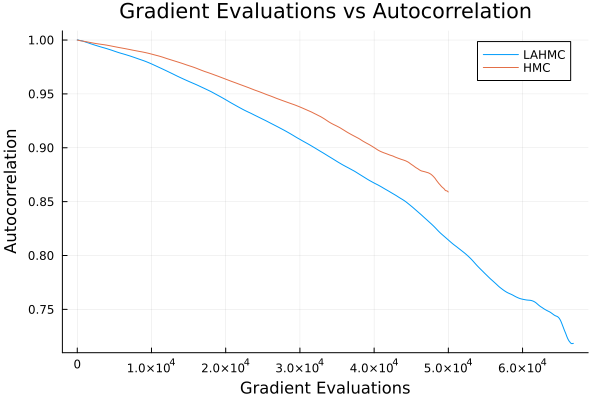

In [20]:
autocorrelation_lahmc = autocorrelation(lahmc_samples[:samples])
autocorrelation_hmc = autocorrelation(hmc_samples[:samples])

gradient_evaluations_lahmc = LinRange(0, lahmc_samples[:grad_evals]/n_chains, length(autocorrelation_lahmc))
gradient_evaluations_hmc = LinRange(0, hmc_samples[:grad_evals]/n_chains, length(autocorrelation_hmc))

plt_lahmc_ac = plot(gradient_evaluations_lahmc, autocorrelation_lahmc, title="Gradient Evaluations vs Autocorrelation", xlabel="Gradient Evaluations", ylabel="Autocorrelation", label="LAHMC")
plt_hmc_ac = plot!(gradient_evaluations_hmc, autocorrelation_hmc, label="HMC")

display(plt_lahmc_ac)

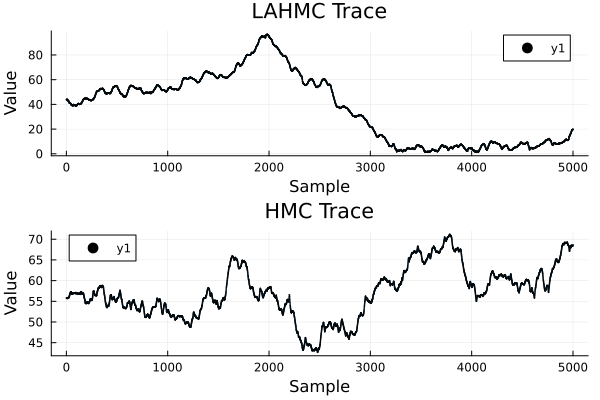

In [21]:
plot(
    scatter(lahmc_samples[:samples][2, 1, :], ms=0.5, title="LAHMC Trace", xlabel="Sample", ylabel="Value"),
    scatter(hmc_samples[:samples][2, 1, :], ms=0.5, title="HMC Trace", xlabel="Sample", ylabel="Value"),
    layout=(2,1)
)

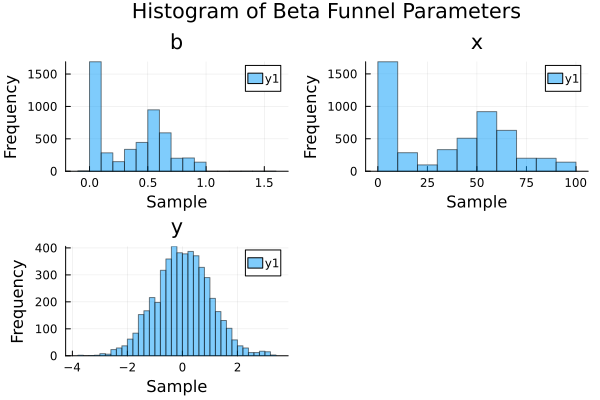

In [22]:
plot(
    plot(title="Histogram of Beta Funnel Parameters", grid = false, showaxis = false, bottom_margin = -50Plots.px),
    histogram(lahmc_samples[:samples][1, 1, :], bin_width=0.01, alpha=0.5, title="b", xlabel="Sample", ylabel="Frequency"),
    histogram(lahmc_samples[:samples][2, 1, :], bin_width=0.01, alpha=0.5, title="x", xlabel="Sample", ylabel="Frequency"),
    histogram(lahmc_samples[:samples][3, 1, :], bin_width=0.01, alpha=0.5, title="y", xlabel="Sample", ylabel="Frequency"),
    layout = (@layout([A{0.08h}; [B C; D E]]))
)


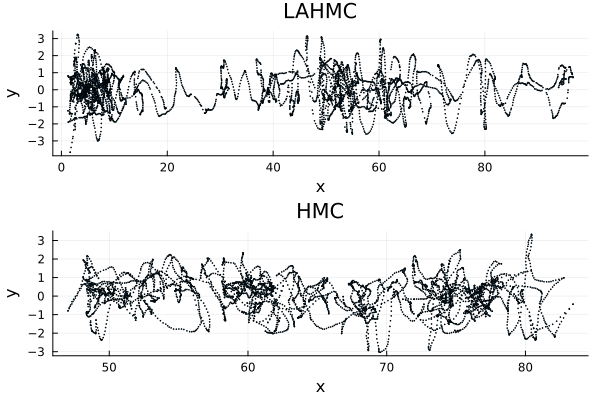

In [23]:
plot(
    scatter(lahmc_samples[:samples][2, 1, :], lahmc_samples[:samples][3, 1, :], ms=0.5, title="LAHMC", xlabel="x", ylabel="y", label=nothing),
    scatter(hmc_samples[:samples][2, 5, :], hmc_samples[:samples][3, 5, :], ms=0.5, title="HMC", xlabel="x", ylabel="y", label=nothing),
    layout=(2,1)
)

In [24]:
lahmc_trans_df = DataFrame(lahmc_samples[:trans])

Row,F,L1,L2,L3,L4,avg_accept
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0684397,0.847137,0.0390898,0.0433827,0.00195039,0.93156


In [25]:
hmc_trans_df = DataFrame(hmc_samples[:trans])

Row,F,L1,avg_accept
,Float64,Float64,Float64
1,0.0908202,0.90918,0.90918


In [26]:
lahmc_chain = Chains(permutedims(lahmc_samples[:samples], (3,1,2)), [:b, :x, :y])
df_lahmc_summary = DataFrame(MCMCChains.summarize(lahmc_chain))
df_lahmc_summary

Row,parameters,mean,std,mcse,ess_bulk,ess_tail,rhat,ess_per_sec
,Symbol,Float64,Float64,Float64,Float64,Float64,Float64,Missing
1,b,0.533045,0.289177,0.00884914,1078.82,1435.77,2.10985,missing
2,x,53.2362,28.5798,0.885204,1050.79,1294.91,2.20338,missing
3,y,0.0200304,1.01746,0.00669001,23271.4,9024.29,1.01945,missing


In [27]:
hmc_chain = Chains(permutedims(hmc_samples[:samples], (3,1,2)), [:b, :x, :y])
df_hmc_summary = DataFrame(MCMCChains.summarize(hmc_chain))
df_hmc_summary

Row,parameters,mean,std,mcse,ess_bulk,ess_tail,rhat,ess_per_sec
,Symbol,Float64,Float64,Float64,Float64,Float64,Float64,Missing
1,b,0.523318,0.177566,0.00537897,1070.42,1178.59,2.33695,missing
2,x,52.2506,17.2947,0.537086,1041.8,1142.43,2.49879,missing
3,y,-0.0208538,1.00358,0.00853776,13818.5,18235.0,1.00918,missing


In [28]:
# ridges = [0.5, 1, 1.5, 2]
# lahmc_rhats = fill(NaN, n_param, length(ridges))
# hmc_rhats = fill(NaN, n_param, length(ridges))

# for i in 1:length(ridges)
#     function U(X)
#         a = X[1]
#         b1 = X[2]
#         b2 = X[3]
#         return -(logpdf(Beta(ridges[i], ridges[i]), a) + logpdf(MvNormal([100*a, 0], [1 0; 0 1]), [b1, b2]))  
#     end
    
#     function dU(X)
#         return ForwardDiff.gradient(U, [X[1], X[2], X[3]])
#     end
    
#     function init_q()
#         init_sample = [randn(), rand(Normal(50, 5)), randn()]
#         return init_sample
#     end

#     lahmc_samples = sample_loop(n_chains, U, dU, init_q, epsilon, L, 4, beta, n_param, n_samples)
#     hmc_samples = sample_loop(n_chains, U, dU, init_q, epsilon, L, 1, beta, n_param, n_samples)

#     lahmc_chain = Chains(permutedims(lahmc_samples[:samples], (3,1,2)), [:b, :x, :y])
#     lahmc_rhats[:,i] = DataFrame(MCMCChains.summarize(lahmc_chain)).rhat

#     hmc_chain = Chains(permutedims(hmc_samples[:samples], (3,1,2)), [:b, :x, :y])
#     hmc_rhats[:,i] = DataFrame(MCMCChains.summarize(hmc_chain)).rhat
# end


In [29]:
# plot(
#     plot(title="Rhat vs Beta Distribution Scales", grid = false, showaxis = false, bottom_margin = -50Plots.px),
#     plot(ridges, [lahmc_rhats[1,:], hmc_rhats[1,:]], xlabel="α", ylabel="Rhat", labels=["LAHMC" "HMC"]),
#     plot(ridges, [lahmc_rhats[2,:], hmc_rhats[2,:]], xlabel="α", ylabel="Rhat", labels=["LAHMC" "HMC"]),
#     plot(ridges, [lahmc_rhats[3,:], hmc_rhats[3,:]], xlabel="α", ylabel="Rhat", labels=["LAHMC" "HMC"]),
#     layout = (@layout([A{0.01h}; [B C; D E]]))
# )
